In [1]:
import adsb_util
import matplotlib.pyplot as plt
import numpy as np
import os


In [2]:
flightVectors = adsb_util.pfs('adsb_data/20181210_jfk24h')

In [3]:
flightDf = adsb_util.tdf(flightVectors)

In [4]:
flightDf.head()


,Id,Lat,Long,Flighttime,Stationtime,Latency,Altitude,Military,Distance,Mlat
0,10530047,40.794000,-74.089100,1544457946729,1544457951277,4548,2775,False,30.93,True
1,10530047,40.803100,-74.101700,1544458052704,1544458081476,28772,2800,False,32.37,True
2,10530047,40.718591,-74.140611,1544493754685,1544493763432,8747,2200,False,31.46,True
3,10530047,40.718591,-74.140611,1544493754862,1544493828427,73565,3800,False,31.46,True
4,10530047,40.826359,-74.079874,1544534839419,1544534846121,6702,2425,False,32.42,True


In [5]:
flightDf = adsb_util.clean(flightDf)
flightDf[flightDf.Latency > 0].count()

Id             23754
Lat            23754
Long           23754
Flighttime     23754
Stationtime    23754
Latency        23754
Altitude       23754
Military       23754
Distance       23754
Mlat           23754
dtype: int64

In [6]:
flightDf.describe()

,Id,Lat,Long,Flighttime,Stationtime,Latency,Altitude,Distance
count,2.375400e+04,23754.000000,23754.000000,2.375400e+04,2.375400e+04,2.375400e+04,23754.000000,23754.000000
mean,1.051927e+07,40.658684,-73.853697,1.544495e+12,1.544496e+12,7.786306e+05,6284.585586,18.516747
std,1.882032e+06,0.123545,0.168406,2.616063e+07,2.661315e+07,3.600874e+06,8465.621197,9.391759
min,4.529400e+04,40.345893,-74.170349,1.544454e+12,1.544458e+12,1.000000e+00,17.000000,0.270000
25%,1.063041e+07,40.580475,-73.983369,1.544474e+12,1.544474e+12,9.140000e+02,1250.000000,12.150000
50%,1.094043e+07,40.660711,-73.867490,1.544489e+12,1.544490e+12,2.550000e+03,2750.000000,19.330000
75%,1.125705e+07,40.747162,-73.765453,1.544523e+12,1.544526e+12,9.021500e+03,7400.000000,26.130000
max,1.522084e+07,40.938200,-73.391200,1.544544e+12,1.544544e+12,3.567781e+07,44400.000000,33.000000


In [7]:
print(flightDf['Latency'].max(), flightDf['Distance'].max())

35677811 33.0


<AxesSubplot:>

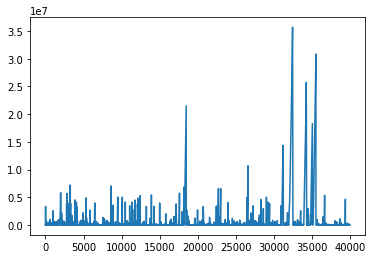

In [8]:
flightDf['Latency'].plot()

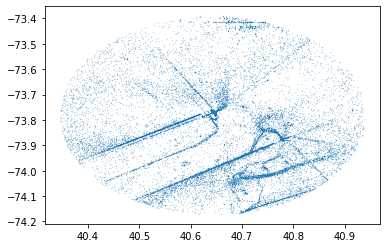

In [9]:
plt.scatter(flightDf['Lat'], flightDf['Long'], s=0.01)
plt.show()

In [30]:
# Plot of atltitude and latency

altDf = flightDf[['Altitude', 'Latency']]
print(altDf[altDf.Altitude > 0].count())
altDf = altDf[altDf.Altitude > 0] 
altDf.describe()


Altitude    23754
Latency     23754
dtype: int64


,Altitude,Latency
count,23754.000000,2.375400e+04
mean,6284.585586,7.786306e+05
std,8465.621197,3.600874e+06
min,17.000000,1.000000e+00
25%,1250.000000,9.140000e+02
50%,2750.000000,2.550000e+03
75%,7400.000000,9.021500e+03
max,44400.000000,3.567781e+07


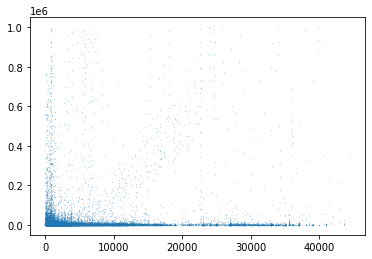

In [32]:
altDf = altDf[altDf.Latency < 1e6]
plt.scatter(altDf['Altitude'], altDf['Latency'], s=0.01)
plt.show()
# Random distribution

In [33]:
def cov(df, fx, fy):
    ux = df[fx].mean()
    uy = df[fy].mean()

    return ((df[fx] - ux) * (df[fy] - uy)).mean()

def rho(df, fx, fy):
    return cov(df, fy, fx)/(df[fx].var() * df[fy].var())




In [34]:

# There is no correlation between 'Altitude' and 'Latency'
cov(altDf, 'Altitude', 'Latency')
rho(altDf, 'Altitude', 'Latency')



9.927290177215753e-11

In [14]:
posDf = flightDf[['Lat', 'Long', 'Latency']]

posDf.describe()

,Lat,Long,Latency
count,23754.000000,23754.000000,2.375400e+04
mean,40.658684,-73.853697,7.786306e+05
std,0.123545,0.168406,3.600874e+06
min,40.345893,-74.170349,1.000000e+00
25%,40.580475,-73.983369,9.140000e+02
50%,40.660711,-73.867490,2.550000e+03
75%,40.747162,-73.765453,9.021500e+03
max,40.938200,-73.391200,3.567781e+07


In [15]:
posDf['OriginDist'] = (posDf['Lat'] * posDf['Lat'] + posDf['Long'] * posDf['Long']).apply(np.sqrt)

posDf.describe()
# flightDf[sqrt(flightDf.Lat * flightDf.Lat + flightDf.Long * flightDf.Long)]

<ipython-input-15-d69138be027d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  posDf['OriginDist'] = (posDf['Lat'] * posDf['Lat'] + posDf['Long'] * posDf['Long']).apply(np.sqrt)


,Lat,Long,Latency,OriginDist
count,23754.000000,23754.000000,2.375400e+04,23754.000000
mean,40.658684,-73.853697,7.786306e+05,84.306073
std,0.123545,0.168406,3.600874e+06,0.163842
min,40.345893,-74.170349,1.000000e+00,83.864259
25%,40.580475,-73.983369,9.140000e+02,84.220672
50%,40.660711,-73.867490,2.550000e+03,84.313485
75%,40.747162,-73.765453,9.021500e+03,84.438966
max,40.938200,-73.391200,3.567781e+07,84.605920


<AxesSubplot:>

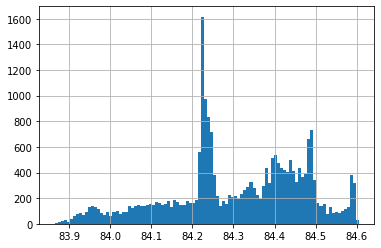

In [16]:
posDf['OriginDist'].hist(bins=100)

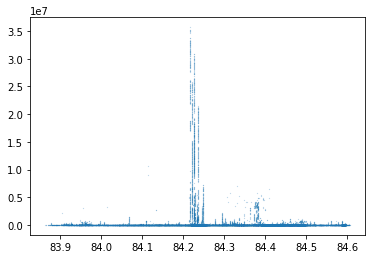

In [17]:
plt.scatter(posDf['OriginDist'], posDf['Latency'], s=0.01)
plt.show()

In [18]:

rho(posDf, 'OriginDist', 'Latency')

# No seemingly valuable relationship

-1.6700579469087456e-07

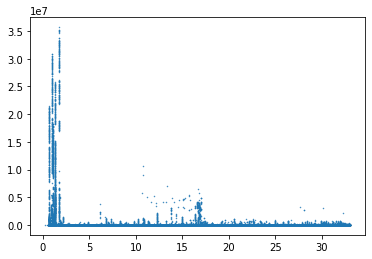

In [19]:
distDf = flightDf[['Distance', 'Latency']]
plt.scatter(distDf['Distance'], distDf['Latency'], s = 0.2)

In [20]:
rho(distDf, 'Distance', 'Latency')

-1.1128732898177975e-08